# Problem Statement : Customer Churn Prediction

### **About the dataset** : 
This dataset if from an online tea retail store which sells tea of different flavors across various cities in India. The dataset contains data about the store's customers, their orders, quantity ordered, order frequency, city,etc. 
This can be used to understand what are the various marketing strategy based on consumer behaviour that can be adopted to increase customer retention of a retail store.

### Importing libraries

In [ ]:
#!pip install lime
#!pip install shap
#!pip install imblearn

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as s
import matplotlib.pyplot as plt
#sns.set(style = 'whitegrid')
import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import classification_report

from sklearn.feature_selection import RFE
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler

import statsmodels.api as sm

from sklearn.metrics import confusion_matrix,precision_score,f1_score,cohen_kappa_score,accuracy_score, recall_score

from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn.metrics import plot_confusion_matrix,plot_roc_curve,roc_auc_score,roc_curve

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,StackingClassifier

from xgboost import XGBClassifier

import pydotplus

from IPython.display import Image

import os


from sklearn.model_selection import GridSearchCV,RandomizedSearchCV, cross_val_score

import lime

from lime import lime_tabular

import shap

from statsmodels.stats.outliers_influence import variance_inflation_factor

### Cleaning the Data

In [3]:
data = pd.read_excel('storedata_total.xlsx')
data.head()

,custid,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,favday,city
0,6H6T6N,0,2012-09-28,2013-08-11 00:00:00,2013-08-11 00:00:00,29,100.000000,3.448276,14.52,0.000000,0,0,0,Monday,DEL
1,APCENR,1,2010-12-19,2011-04-01 00:00:00,2014-01-19 00:00:00,95,92.631579,10.526316,83.69,0.181641,1,1,1,Friday,DEL
2,7UP6MS,0,2010-10-03,2010-12-01 00:00:00,2011-07-06 00:00:00,0,0.000000,0.000000,33.58,0.059908,0,0,0,Wednesday,DEL
3,7ZEW8G,0,2010-10-22,2011-03-28 00:00:00,2011-03-28 00:00:00,0,0.000000,0.000000,54.96,0.000000,0,0,0,Thursday,BOM
4,8V726M,1,2010-11-27,2010-11-29 00:00:00,2013-01-28 00:00:00,30,90.000000,13.333333,111.91,0.008850,0,0,0,Monday,BOM


### Column Details 
1. **custid** : Referring to the customer id of the customers 
2. **retained** : 1, if customer is assumed to be active, 0 = otherwise 
3. **created** : Date when the contact was created in the database - when the customer joined 
4. **firstorder** : Date when customer made the first order 
5. **lastorder** : Date when customer made the last order 
6. **esent** : Number of emails sent 
7. **eopenrate** : Number of emails opened divided by number of emails sent 
8. **eclickrate** : Number of emails clicked divided by number of emails sent 
9. **avgorder** : Average order size for the customer 
10. **orderfreq** : frequency of orders 
11. **paperless** : 1 if customer subscribed for paperless communication (only online) 
12. **refill** : 1 if customer subscribed for automatic refill 
13. **doorstep** : 1 if customer subscribed for doorstep delivery 
14. **favday** : Customer's favorite delivery day 
15. **city** : city the customer belongs to

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30801 entries, 0 to 30800
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   custid      30781 non-null  object        
 1   retained    30801 non-null  int64         
 2   created     30781 non-null  datetime64[ns]
 3   firstorder  30781 non-null  object        
 4   lastorder   30781 non-null  object        
 5   esent       30801 non-null  int64         
 6   eopenrate   30801 non-null  float64       
 7   eclickrate  30801 non-null  float64       
 8   avgorder    30801 non-null  float64       
 9   ordfreq     30801 non-null  float64       
 10  paperless   30801 non-null  int64         
 11  refill      30801 non-null  int64         
 12  doorstep    30801 non-null  int64         
 13  favday      30801 non-null  object        
 14  city        30801 non-null  object        
dtypes: datetime64[ns](1), float64(4), int64(5), object(5)
memory usage: 3.

In [5]:
data.describe()

,retained,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep
count,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000
mean,0.794520,28.138405,25.554838,5.671139,61.873944,0.037729,0.649037,0.095094,0.038895
std,0.404059,16.751380,29.557106,10.561704,41.007588,0.103932,0.477279,0.293350,0.193347
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,16.000000,2.040816,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,32.000000,13.207547,0.000000,50.970000,0.000000,1.000000,0.000000,0.000000
75%,1.000000,42.000000,40.000000,7.142857,74.280000,0.040816,1.000000,0.000000,0.000000
max,1.000000,291.000000,100.000000,100.000000,2600.140000,3.250000,1.000000,1.000000,1.000000


In [6]:
data.isnull().sum()

custid        20
retained       0
created       20
firstorder    20
lastorder     20
esent          0
eopenrate      0
eclickrate     0
avgorder       0
ordfreq        0
paperless      0
refill         0
doorstep       0
favday         0
city           0
dtype: int64

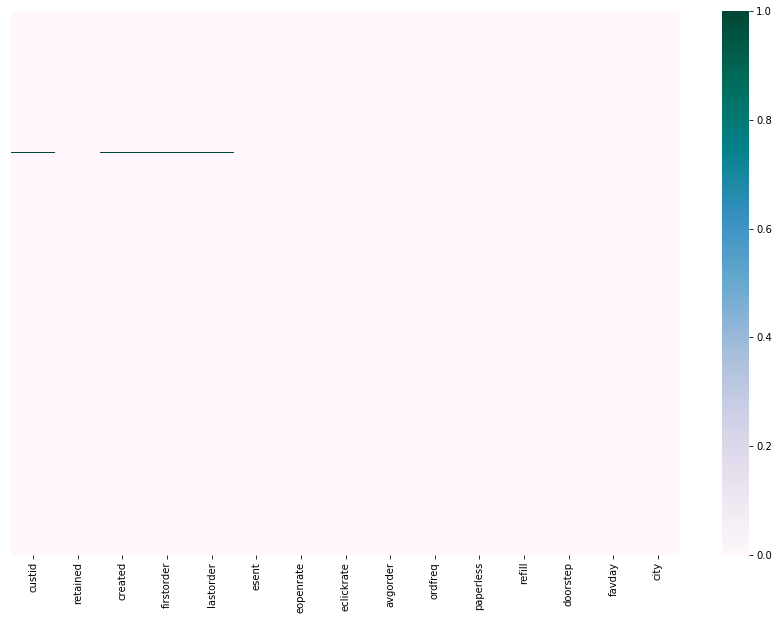

In [9]:
plt.figure(figsize=(15,10))
sns.heatmap(data.isnull(),cmap='PuBuGn',yticklabels=False);

In [4]:
data.fillna(method='bfill',inplace=True)

In [8]:
data.isnull().sum()

custid        0
retained      0
created       0
firstorder    0
lastorder     0
esent         0
eopenrate     0
eclickrate    0
avgorder      0
ordfreq       0
paperless     0
refill        0
doorstep      0
favday        0
city          0
dtype: int64

In [5]:
first_ord = []
for i in range(0,len(data)):
    if i in data[(data.firstorder == '1/0/00')].index:
        first_ord.append(data.created[i])
    else:
        first_ord.append(data.firstorder[i])
data['firstorder'] = first_ord

last_ord = []
for i in range(0,len(data)):
    if i in data[data.lastorder == '1/0/00'].index:
        last_ord.append(data.firstorder[i])
    else:
        last_ord.append(data.lastorder[i])
data['lastorder'] = last_ord

In [6]:
data.to_excel('Store_Data_after_EDA.xlsx',index=False)

### Reading the cleaned data

In [7]:
data = pd.read_excel('Store_Data_after_EDA.xlsx')

#data = data.drop(columns=['Unnamed: 0', 'index'],axis=1)
data.head()

,custid,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,favday,city
0,6H6T6N,0,2012-09-28,2013-08-11 00:00:00,2013-08-11 00:00:00,29,100.000000,3.448276,14.52,0.000000,0,0,0,Monday,DEL
1,APCENR,1,2010-12-19,2011-04-01 00:00:00,2014-01-19 00:00:00,95,92.631579,10.526316,83.69,0.181641,1,1,1,Friday,DEL
2,7UP6MS,0,2010-10-03,2010-12-01 00:00:00,2011-07-06 00:00:00,0,0.000000,0.000000,33.58,0.059908,0,0,0,Wednesday,DEL
3,7ZEW8G,0,2010-10-22,2011-03-28 00:00:00,2011-03-28 00:00:00,0,0.000000,0.000000,54.96,0.000000,0,0,0,Thursday,BOM
4,8V726M,1,2010-11-27,2010-11-29 00:00:00,2013-01-28 00:00:00,30,90.000000,13.333333,111.91,0.008850,0,0,0,Monday,BOM


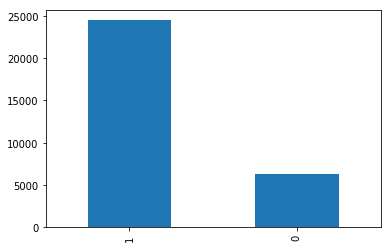

In [12]:
data.retained.value_counts().plot(kind='bar')
plt.show()

In [13]:
# The data is imbalanced.

### Changing the columns into datetime

#### Looking at the datatypes, we can see that the datatype for column 4 and 5("firstorder" and "lastorder") is incorrect, hence we need to change it to datetime 

In [8]:
data['firstorder']= data.firstorder.astype('datetime64')
data['lastorder'] = data.lastorder.astype('datetime64')

### Data information

In [15]:
data.describe()

,retained,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep
count,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000
mean,0.794520,28.138405,25.554838,5.671139,61.873944,0.037729,0.649037,0.095094,0.038895
std,0.404059,16.751380,29.557106,10.561704,41.007588,0.103932,0.477279,0.293350,0.193347
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,16.000000,2.040816,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,32.000000,13.207547,0.000000,50.970000,0.000000,1.000000,0.000000,0.000000
75%,1.000000,42.000000,40.000000,7.142857,74.280000,0.040816,1.000000,0.000000,0.000000
max,1.000000,291.000000,100.000000,100.000000,2600.140000,3.250000,1.000000,1.000000,1.000000


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30801 entries, 0 to 30800
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   custid      30801 non-null  object        
 1   retained    30801 non-null  int64         
 2   created     30801 non-null  datetime64[ns]
 3   firstorder  30801 non-null  datetime64[ns]
 4   lastorder   30801 non-null  datetime64[ns]
 5   esent       30801 non-null  int64         
 6   eopenrate   30801 non-null  float64       
 7   eclickrate  30801 non-null  float64       
 8   avgorder    30801 non-null  float64       
 9   ordfreq     30801 non-null  float64       
 10  paperless   30801 non-null  int64         
 11  refill      30801 non-null  int64         
 12  doorstep    30801 non-null  int64         
 13  favday      30801 non-null  object        
 14  city        30801 non-null  object        
dtypes: datetime64[ns](3), float64(4), int64(5), object(3)
memory usage: 3.

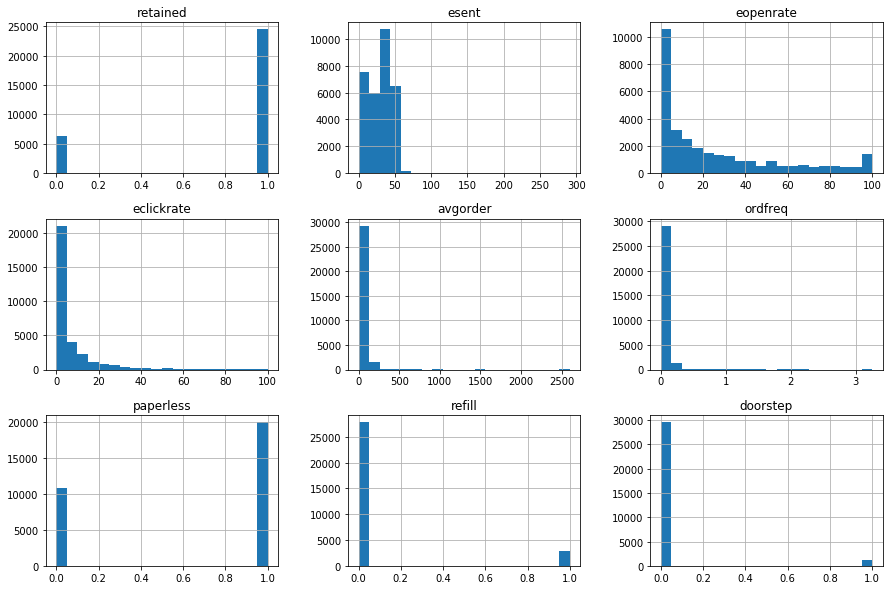

In [17]:
data.hist(bins=20,figsize=(15,10))
plt.show()

In [9]:
data['create_first'] = data.firstorder - data.created
data['create_first'] = data['create_first']/np.timedelta64(1,'D')
data['first_last'] = data.lastorder - data.firstorder
data['first_last'] = data['first_last']/np.timedelta64(1,'D')

In [19]:
data.describe()

,retained,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,create_first,first_last
count,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000
mean,0.794520,28.138405,25.554838,5.671139,61.873944,0.037729,0.649037,0.095094,0.038895,41.357423,90.940002
std,0.404059,16.751380,29.557106,10.561704,41.007588,0.103932,0.477279,0.293350,0.193347,127.204151,224.837296
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-39.000000,0.000000
25%,1.000000,16.000000,2.040816,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,32.000000,13.207547,0.000000,50.970000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,1.000000,42.000000,40.000000,7.142857,74.280000,0.040816,1.000000,0.000000,0.000000,22.000000,46.000000
max,1.000000,291.000000,100.000000,100.000000,2600.140000,3.250000,1.000000,1.000000,1.000000,1998.000000,2487.000000


In [10]:
data = data.drop(['ordfreq','custid'],axis=1)

In [11]:
data = data.drop(['firstorder','lastorder','created'],axis=1)

In [22]:
data.head()

,retained,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
0,0,29,100.000000,3.448276,14.52,0,0,0,Monday,DEL,317.0,0.0
1,1,95,92.631579,10.526316,83.69,1,1,1,Friday,DEL,103.0,1024.0
2,0,0,0.000000,0.000000,33.58,0,0,0,Wednesday,DEL,59.0,217.0
3,0,0,0.000000,0.000000,54.96,0,0,0,Thursday,BOM,157.0,0.0
4,1,30,90.000000,13.333333,111.91,0,0,0,Monday,BOM,2.0,791.0


### Test-Train Split

In [12]:
inp = data.drop('retained',axis=1)
out = data.retained
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest = train_test_split(inp,out,test_size=0.3,random_state=12)

### Outlier Treatment

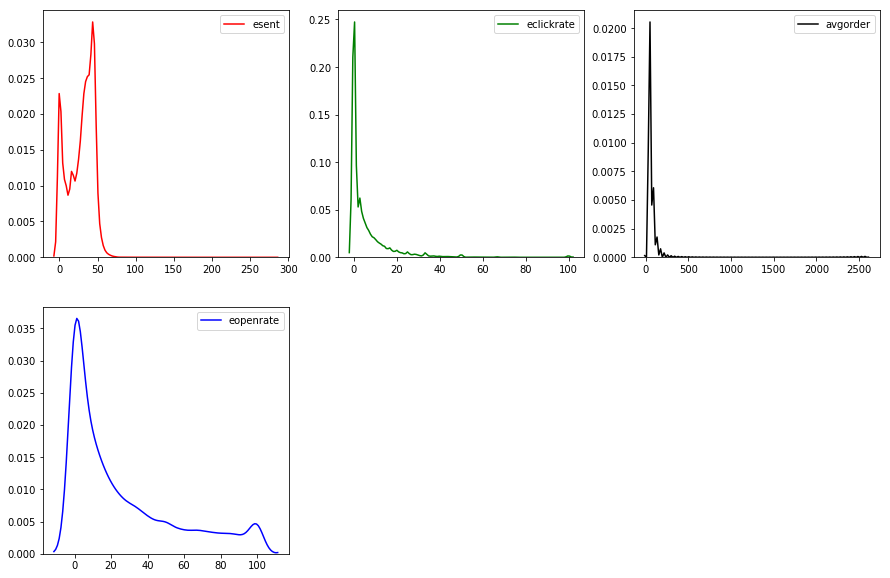

In [24]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.kdeplot(xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.kdeplot(data.eclickrate,color='green')
plt.subplot(2,3,3)
sns.kdeplot(data.avgorder,color='black')
plt.subplot(2,3,4)
sns.kdeplot(data.eopenrate,color='blue')
plt.show()

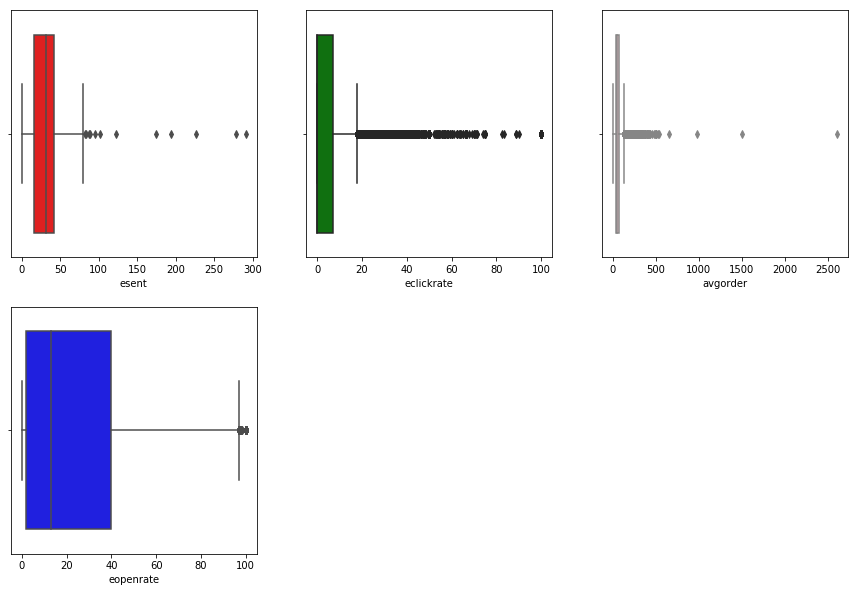

In [25]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.boxplot(x = data.esent,color='red');
plt.subplot(2,3,2)
sns.boxplot(x = data.eclickrate,color='green')
plt.subplot(2,3,3)
sns.boxplot(x = data.avgorder,color='pink')
plt.subplot(2,3,4)
sns.boxplot(data.eopenrate,color='blue')
plt.show()

In [13]:
def impute(x):
    for i in x.columns:
        iqr = 1.5*(x[i].quantile(0.75) - x[i].quantile(0.25))
        ul = x[i].quantile(0.75) + iqr
        ll = x[i].quantile(0.25) - iqr
        temp = []
        for j in x[i].index:
            if x[i][j] > ul or x[i][j] < ll :
                temp.append(np.median(x[i]))
            elif x[i][j] < 0:
                temp.append(0)
            else:
                temp.append(x[i][j])
        x[i]= temp
    return x

In [14]:
xtrain[['esent','eclickrate','avgorder','eopenrate']] = impute(xtrain[['esent','eclickrate','avgorder','eopenrate']])
xtest[['esent','eclickrate','avgorder','eopenrate']] = impute(xtest[['esent','eclickrate','avgorder','eopenrate']])

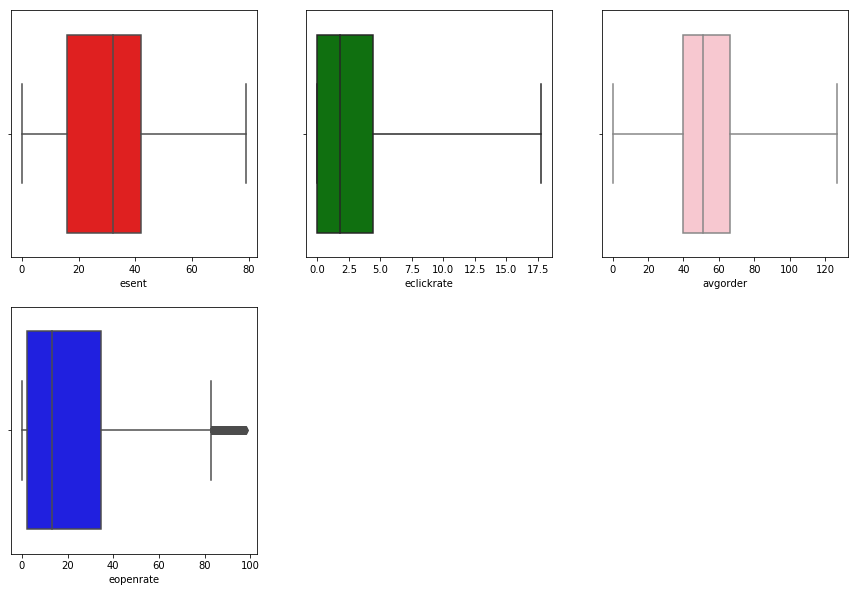

In [28]:



plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.boxplot(x = xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.boxplot(x = xtrain.eclickrate,color='green',whis=6)
plt.subplot(2,3,3)
sns.boxplot(x = xtrain.avgorder,color='pink',whis=3)
plt.subplot(2,3,4)
sns.boxplot(xtrain.eopenrate,color='blue')
plt.show()

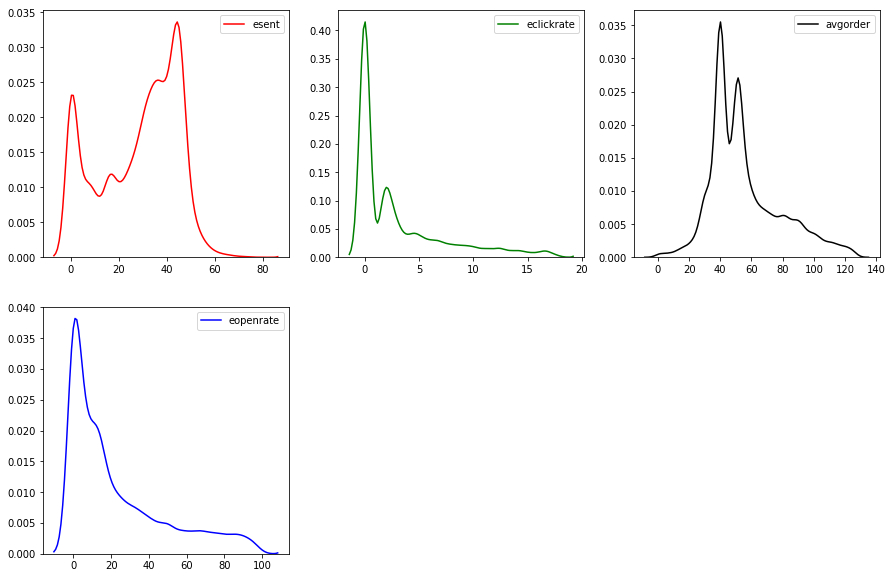

In [29]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.kdeplot(xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.kdeplot(xtrain.eclickrate,color='green')
plt.subplot(2,3,3)
sns.kdeplot(xtrain.avgorder,color='black')
#plt.subplot(2,3,4)
#sns.kdeplot(xtrain.ordfreq,color='orange')
plt.subplot(2,3,4)
sns.kdeplot(xtrain.eopenrate,color='blue')
plt.show()

In [30]:
xtrain.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000
mean,28.134647,22.486722,2.954306,55.275783,0.648840,0.094017,0.039100,41.448980,92.858256
std,16.502098,25.799586,4.249084,22.770930,0.477344,0.291859,0.193838,125.515201,227.013184
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-39.000000,0.000000
25%,16.000000,2.127660,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,32.000000,13.333333,1.785714,51.120000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,42.000000,34.498433,4.444444,66.522500,1.000000,0.000000,0.000000,22.000000,49.000000
max,79.000000,98.000000,17.777778,126.570000,1.000000,1.000000,1.000000,1915.000000,2445.000000



## Data Visualization

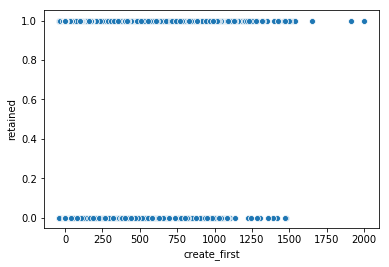

In [31]:
sns.scatterplot(x = data.create_first, y = data.retained)

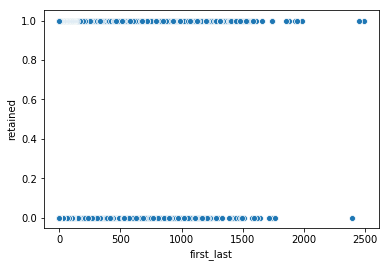

In [32]:
sns.scatterplot(x = data.first_last, y = data.retained)

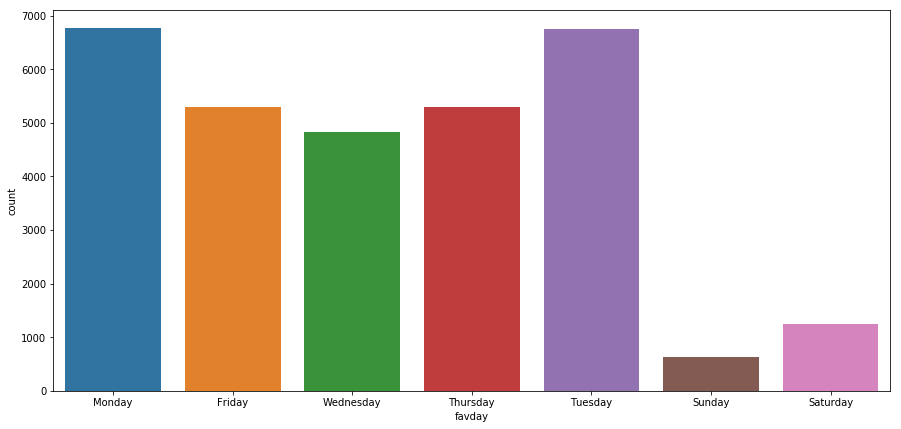

In [33]:
plt.figure(figsize=(15,7))
sns.countplot(x = data.favday)
plt.show()

**Insight**: The above graph talks about the favourite delivery days of the customers. We can see that most of the customers choose their delivery day over the weekdays(Monday and Friday being the highest) than over the weekends.

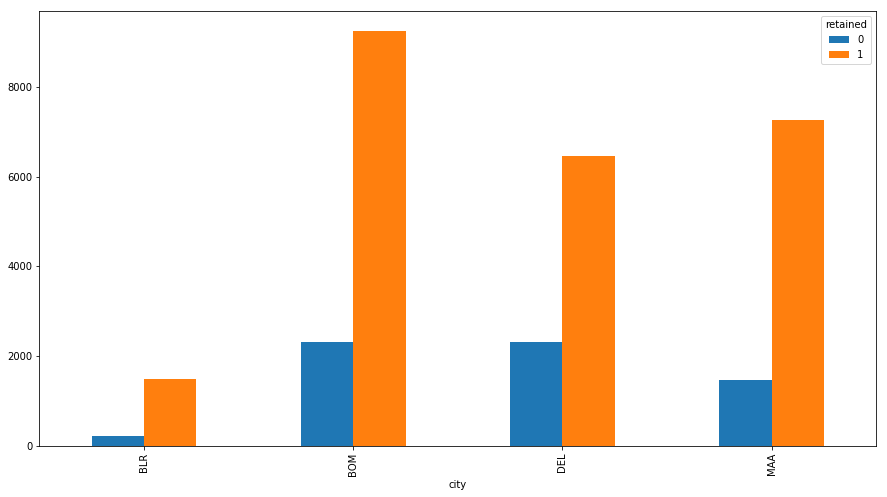

In [34]:
pd.crosstab(index=data.city,columns=data.retained).plot(kind='bar',figsize=(15,8))

**Insight**: The above graph shows city wise retained customers where blue indicates that the cutomer has churned and orange shows that the company was able to retain those customers from churning. It's quite evident from the graph that Mumbai and Delhi has more number of churned customers hence there is a scope to improve on the strategies to retain more customers. 

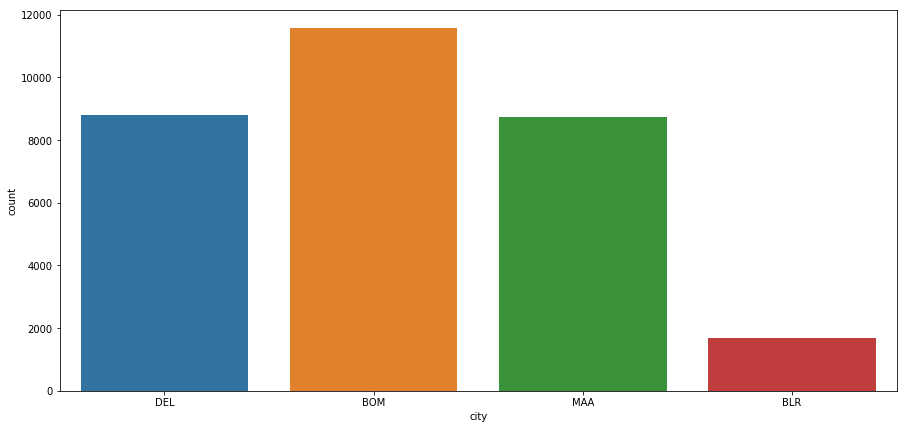

In [35]:
plt.figure(figsize=(15,7))
sns.countplot(x = data.city)
plt.show()

**Insight**: The above graph talks about the city where the customers belong to. From the above graph, we can say that there are highest number of customers from Mumbai

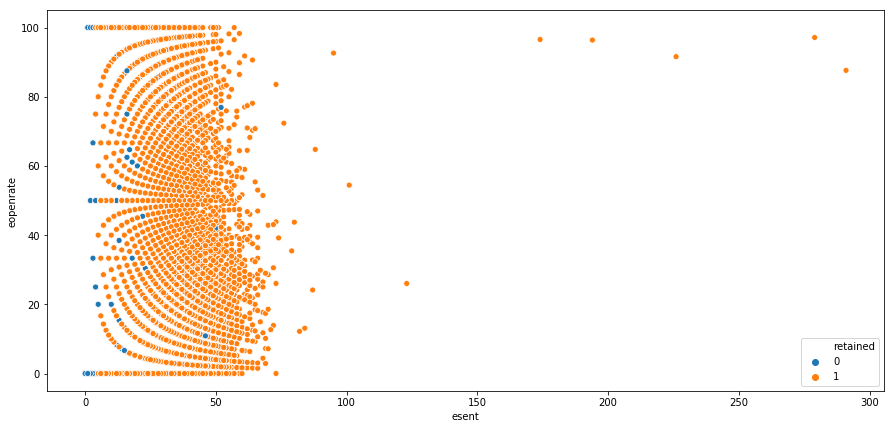

In [36]:
plt.figure(figsize=(15,7))
sns.scatterplot(x= data.esent, y = data.eopenrate, hue= data.retained)
plt.show()

**Insight**: Most of the values of eopenrate lies less than esent = 80.

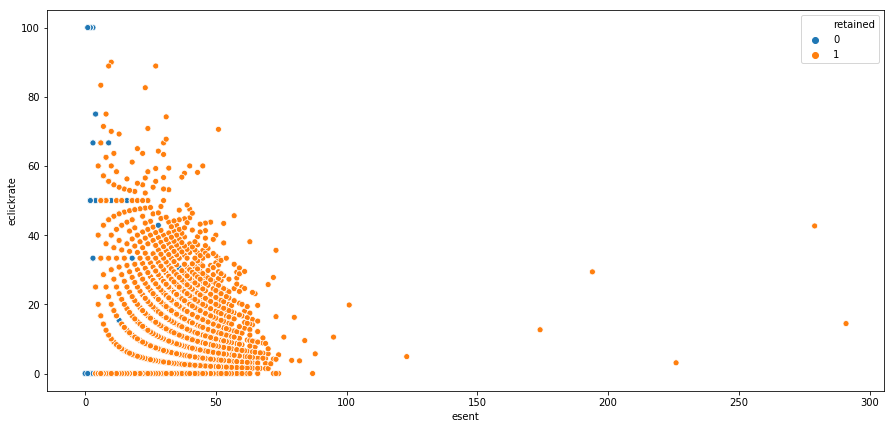

In [37]:

plt.figure(figsize=(15,7))
sns.scatterplot(x= data.esent, y = data.eclickrate, hue= data.retained)
plt.show()

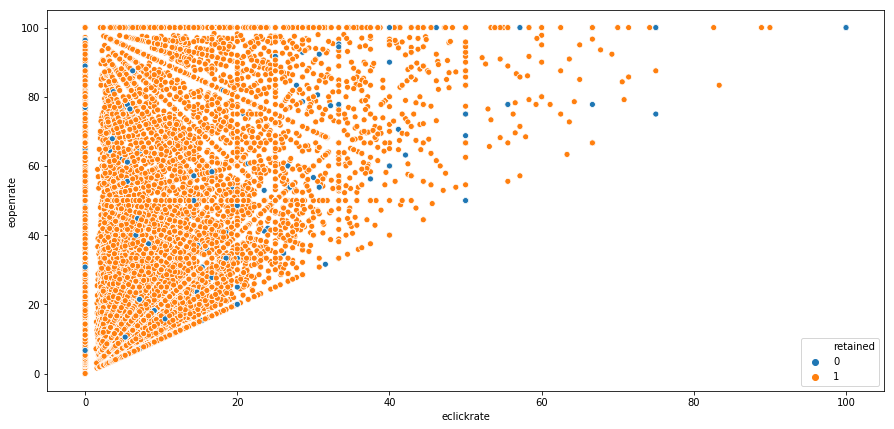

In [38]:
plt.figure(figsize=(15,7))
sns.scatterplot(x= data.eclickrate, y = data.eopenrate, hue= data.retained)
plt.show()

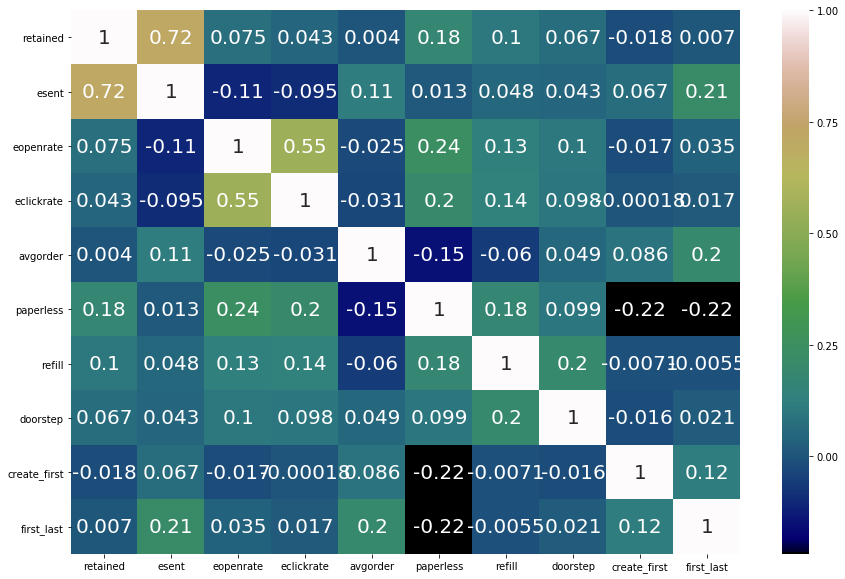

In [39]:
plt.figure(figsize=(15,10))
sns.heatmap(data.corr(),annot=True,annot_kws={'size':20}, cmap = 'gist_earth');

**Insight** : We could observe slight correlation between independent variables

In [40]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
11817,45.0,4.444444,2.222222,79.24,1,0,0,Thursday,BLR,22.0,0.0
30419,16.0,31.250000,6.250000,40.02,1,0,0,Tuesday,DEL,0.0,0.0
19590,30.0,0.000000,0.000000,51.05,1,0,0,Friday,MAA,0.0,0.0
27767,7.0,14.285714,0.000000,40.02,1,0,0,Friday,BOM,0.0,0.0
632,40.0,20.000000,7.500000,51.97,0,0,0,Thursday,MAA,14.0,0.0


In [41]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
28560,34.0,41.176471,0.0,40.02,1,0,0,Friday,DEL,0.0,0.0
24420,6.0,50.000000,0.0,40.02,1,1,0,Thursday,MAA,0.0,0.0
4877,40.0,10.000000,7.5,69.58,0,0,0,Thursday,MAA,420.0,0.0
26361,47.0,2.127660,0.0,93.96,0,0,0,Wednesday,DEL,22.0,683.0
26882,46.0,26.086957,0.0,36.51,0,1,0,Friday,BOM,1026.0,50.0


## Transformation

In [15]:
xtrain['avgorder'] = s.boxcox(xtrain.avgorder+1)[0]
xtrain['esent'] = s.boxcox(xtrain.esent+1)[0]
xtrain['eopenrate'] = s.boxcox(xtrain.eopenrate+1)[0]
xtrain['eclickrate'] = s.boxcox(xtrain.eclickrate+1)[0]
xtrain['create_first'] = s.boxcox(abs(xtrain.create_first)+1)[0]
xtrain['first_last'] = s.boxcox(xtrain.first_last+5)[0]

In [43]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
11817,29.424874,1.929047,0.900515,12.759568,1,0,0,Thursday,BLR,2.049952,1.046056
30419,11.934921,4.556397,1.290189,9.019938,1,0,0,Tuesday,DEL,0.000000,1.046056
19590,20.691094,0.000000,0.000000,10.227476,1,0,0,Friday,MAA,0.000000,1.046056
27767,5.725140,3.367992,0.000000,9.019938,1,0,0,Friday,BOM,0.000000,1.046056
632,26.568760,3.857349,1.350722,10.321220,0,0,0,Thursday,MAA,1.868461,1.046056


In [16]:
xtest['avgorder'] = s.boxcox(xtest.avgorder+1)[0]
xtest['esent'] = s.boxcox(xtest.esent+1)[0]
xtest['eopenrate'] = s.boxcox(xtest.eopenrate+1)[0]
xtest['eclickrate'] = s.boxcox(xtest.eclickrate+1)[0]
xtest['create_first'] = s.boxcox(abs(xtest.create_first)+1)[0]
xtest['first_last'] = s.boxcox(xtest.first_last+5)[0]

In [45]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
28560,22.835287,4.770155,0.000000,9.158151,1,0,0,Friday,DEL,0.000000,1.006570
24420,4.958988,5.076936,0.000000,9.158151,1,1,0,Thursday,MAA,0.000000,1.006570
4877,26.281616,2.795733,1.059095,12.176130,0,0,0,Thursday,MAA,2.724094,1.006570
26361,30.206680,1.225493,0.000000,14.149353,0,0,0,Wednesday,DEL,2.002614,1.544909
26882,29.651606,4.082677,0.000000,8.724858,0,1,0,Friday,BOM,2.842973,1.447217


In [46]:
xtest.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000
mean,18.685202,2.897770,0.394975,10.470658,0.649497,0.097608,0.038416,0.994525,1.172061
std,10.457237,2.120561,0.488910,2.213639,0.477153,0.296801,0.192208,1.021357,0.222922
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.006570
25%,11.190128,0.000000,0.000000,9.158151,0.000000,0.000000,0.000000,0.000000,1.006570
50%,21.667047,3.075612,0.000000,10.353137,1.000000,0.000000,0.000000,0.623516,1.006570
75%,27.412806,4.725087,0.949377,11.728839,1.000000,0.000000,0.000000,2.018556,1.428561
max,47.723528,6.242608,1.173694,16.150839,1.000000,1.000000,1.000000,2.912555,1.558569


In [47]:
xtrain.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000
mean,18.973933,2.975014,0.579727,10.395828,0.648840,0.094017,0.039100,1.046169,1.249067
std,10.559853,2.129650,0.606762,2.200029,0.477344,0.291859,0.193838,1.054468,0.264881
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.046056
25%,11.934921,1.243442,0.000000,9.019938,0.000000,0.000000,0.000000,0.000000,1.046056
50%,21.886736,3.271676,0.813487,10.234642,1.000000,0.000000,0.000000,0.627208,1.046056
75%,27.717083,4.719024,1.169130,11.694110,1.000000,0.000000,0.000000,2.097944,1.553121
max,47.844703,6.611139,1.593362,16.039565,1.000000,1.000000,1.000000,3.037159,1.704790


## Scaling

In [17]:
SS = StandardScaler()

In [18]:
a = SS.fit_transform(xtrain[['eclickrate','eopenrate','eclickrate','avgorder','esent','create_first','first_last']])

In [19]:
xtrain['eclickrate'] = a[:,0]
xtrain['eopenrate'] = a[:,1]
xtrain['eclickrate'] = a[:,2]
xtrain['avgorder'] = a[:,3]
xtrain['esent'] = a[:,4]
xtrain['create_first'] = a[:,5]
xtrain['first_last'] = a[:,6]

In [51]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
11817,0.989709,-0.491157,0.528700,1.074438,1,0,0,Thursday,BLR,0.951956,-0.766442
30419,-0.666598,0.742573,1.170934,-0.625411,1,0,0,Tuesday,DEL,-0.992153,-0.766442
19590,0.162616,-1.396982,-0.955465,-0.076524,1,0,0,Friday,MAA,-0.992153,-0.766442
27767,-1.254667,0.184532,-0.955465,-0.625411,1,0,0,Friday,BOM,-0.992153,-0.766442
632,0.719234,0.414319,1.270701,-0.033913,0,0,0,Thursday,MAA,0.779836,-0.766442


In [20]:
b = SS.transform(xtest[['eclickrate','eopenrate','eclickrate','avgorder','esent','create_first','first_last']])
b

array([[-0.95546454,  0.84294712, -0.95546454, ...,  0.36567213,
        -0.99215269, -0.91551308],
       [-0.95546454,  0.98700293, -0.95546454, ..., -1.32722199,
        -0.99215269, -0.91551308],
       [ 0.79006043, -0.08418548,  0.79006043, ...,  0.69204109,
         1.59128939, -0.91551308],
       ...,
       [-0.95546454, -1.39698235, -0.95546454, ..., -0.02621076,
        -0.99215269, -0.91551308],
       [ 0.80276059,  0.50435335,  0.80276059, ...,  1.27238098,
         1.36721718,  0.95490047],
       [-0.95546454, -0.79690708, -0.95546454, ...,  0.90553241,
         1.29666131, -0.91551308]])

In [21]:
xtest['eclickrate'] = b[:,0]
xtest['eopenrate'] = b[:,1]
xtest['eclickrate'] = b[:,2]
xtest['avgorder'] = b[:,3]
xtest['esent'] = b[:,4]
xtest['create_first'] = b[:,5]
xtest['first_last'] = b[:,6]

In [54]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
28560,0.365672,0.842947,-0.955465,-0.562586,1,0,0,Friday,DEL,-0.992153,-0.915514
24420,-1.327222,0.987003,-0.955465,-0.562586,1,1,0,Thursday,MAA,-0.992153,-0.915514
4877,0.692041,-0.084185,0.790060,0.809236,0,0,0,Thursday,MAA,1.591290,-0.915514
26361,1.063747,-0.821526,-0.955465,1.706165,0,0,0,Wednesday,DEL,0.907061,1.116910
26882,1.011181,0.520127,-0.955465,-0.759539,0,1,0,Friday,BOM,1.704031,0.748088


## One Hot Encoding

In [22]:
xtrain = pd.concat((xtrain.drop(columns=['city','favday'],axis=1),pd.get_dummies(xtrain[['favday','city']],drop_first=True)),
                   axis=1)

In [56]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
11817,0.989709,-0.491157,0.528700,1.074438,1,0,0,0.951956,-0.766442,0,0,0,1,0,0,0,0,0
30419,-0.666598,0.742573,1.170934,-0.625411,1,0,0,-0.992153,-0.766442,0,0,0,0,1,0,0,1,0
19590,0.162616,-1.396982,-0.955465,-0.076524,1,0,0,-0.992153,-0.766442,0,0,0,0,0,0,0,0,1
27767,-1.254667,0.184532,-0.955465,-0.625411,1,0,0,-0.992153,-0.766442,0,0,0,0,0,0,1,0,0
632,0.719234,0.414319,1.270701,-0.033913,0,0,0,0.779836,-0.766442,0,0,0,1,0,0,0,0,1


In [57]:
xtest = pd.concat((xtest.drop(columns=['city','favday'],axis=1),pd.get_dummies(xtest[['favday','city']],drop_first=True))
                  ,axis=1)

In [58]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
28560,0.365672,0.842947,-0.955465,-0.562586,1,0,0,-0.992153,-0.915514,0,0,0,0,0,0,0,1,0
24420,-1.327222,0.987003,-0.955465,-0.562586,1,1,0,-0.992153,-0.915514,0,0,0,1,0,0,0,0,1
4877,0.692041,-0.084185,0.790060,0.809236,0,0,0,1.591290,-0.915514,0,0,0,1,0,0,0,0,1
26361,1.063747,-0.821526,-0.955465,1.706165,0,0,0,0.907061,1.116910,0,0,0,0,0,1,0,1,0
26882,1.011181,0.520127,-0.955465,-0.759539,0,1,0,1.704031,0.748088,0,0,0,0,0,0,1,0,0


In [59]:
xtrain.to_csv('train.csv')

In [60]:
xtest.to_csv('test.csv')

### Balancing the Data

In [61]:
xtrain.shape

(21560, 18)

In [62]:
ytrain.shape

(21560,)

In [23]:
from imblearn.combine import SMOTEENN

In [24]:
xtrain_bal,ytrain_bal = SMOTEENN().fit_resample(xtrain,ytrain)

<AxesSubplot:>

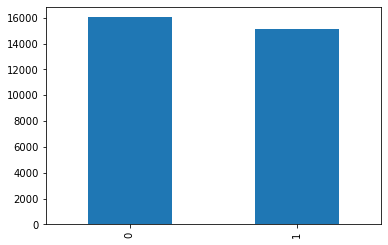

In [25]:
ytrain_bal.value_counts().plot(kind='bar')

## Machine Learning Modelling

#### 1.  LOGISTIC REGRESSION

In [66]:
print(xtrain_bal.shape)
print(ytrain_bal.shape)

(31086, 18)
(31086,)


#### Full Model

In [67]:
log_reg = sm.Logit(ytrain_bal,xtrain_bal).fit()
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.127271
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:               retained   No. Observations:                31086
Model:                          Logit   Df Residuals:                    31068
Method:                           MLE   Df Model:                           17
Date:                Thu, 14 Oct 2021   Pseudo R-squ.:                  0.8163
Time:                        22:37:59   Log-Likelihood:                -3956.3
converged:                       True   LL-Null:                       -21533.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
esent                4.1817      0.057     72.756      0.000       4.069       4.294
eopenrate  

In [68]:
odds = pd.DataFrame((np.exp(log_reg.params)),index = xtrain.columns,columns=['ODDS'])
odds

,ODDS
esent,65.476991
eopenrate,0.796847
eclickrate,1.461994
avgorder,0.924805
paperless,1.178446
refill,4.111310
doorstep,6.561746
create_first,0.575990
first_last,0.650592
favday_Monday,1.672117


In [69]:
ypred = log_reg.predict(xtest)
ypred = [1 if i > 0.5 else 0 for i in ypred]

In [70]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.71      0.90      0.79      1906
           1       0.97      0.90      0.94      7335

    accuracy                           0.90      9241
   macro avg       0.84      0.90      0.86      9241
weighted avg       0.92      0.90      0.91      9241



In [71]:
cp =classification_report(ytest,ypred).split()
cp[5],cp[6],cp[7]

('0.71', '0.90', '0.79')

In [72]:
metrics_df = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Base_model']).T
metrics_df

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902,0.903


## VIF

In [73]:
vif = [variance_inflation_factor(xtrain_bal.values,i) for i in range(xtrain_bal.shape[1])]

In [74]:
vif_df = pd.DataFrame({'Features':xtrain_bal.columns,'VIF':vif})
vif_df.sort_values('VIF',ascending=False)

,Features,VIF
4,paperless,2.786092
15,city_BOM,2.624235
16,city_DEL,2.518731
17,city_MAA,2.511455
2,eclickrate,2.019640
1,eopenrate,2.001900
9,favday_Monday,1.899572
13,favday_Tuesday,1.832790
0,esent,1.672959
14,favday_Wednesday,1.634587


### Feature Selection

In [75]:
LR = LogisticRegression()

In [76]:
## RFE SElection
rfe = RFE(estimator=LR).fit(xtrain_bal,ytrain_bal)

feature_ranking = pd.DataFrame([xtrain_bal.columns,rfe.ranking_],index=['Feature','Ranking']).T
rfe_feat=feature_ranking[feature_ranking.Ranking==1]
rfe_feat.Feature

0               esent
5              refill
6            doorstep
7        create_first
10    favday_Saturday
12    favday_Thursday
15           city_BOM
16           city_DEL
17           city_MAA
Name: Feature, dtype: object

In [77]:
feature_ranking.sort_values('Ranking').reset_index()

,index,Feature,Ranking
0,0,esent,1
1,15,city_BOM,1
2,12,favday_Thursday,1
3,10,favday_Saturday,1
4,16,city_DEL,1
5,7,create_first,1
6,17,city_MAA,1
7,5,refill,1
8,6,doorstep,1
9,14,favday_Wednesday,2


In [78]:
x = xtrain_bal[rfe_feat.Feature]
y= ytrain_bal

rfe_reg = sm.Logit(y,x).fit()
print(rfe_reg.summary())

Optimization terminated successfully.
         Current function value: 0.135086
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:               retained   No. Observations:                31086
Model:                          Logit   Df Residuals:                    31077
Method:                           MLE   Df Model:                            8
Date:                Thu, 14 Oct 2021   Pseudo R-squ.:                  0.8050
Time:                        22:38:03   Log-Likelihood:                -4199.3
converged:                       True   LL-Null:                       -21533.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
esent               4.1343      0.053     77.344      0.000       4.030       4.239
refill        

Confusion Matrix: [[1721  185]
 [ 741 6594]]


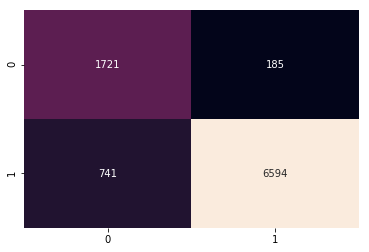

In [79]:
rfe_ypred_test = rfe_reg.predict(xtest[rfe_feat.Feature])
rfe_ypred_test = [1 if i > 0.5 else 0 for i in rfe_ypred_test]
cm_1 = confusion_matrix(ytest,rfe_ypred_test)
print('Confusion Matrix:',cm_1)
sns.heatmap(cm_1,annot=True,cbar=False,fmt='d');

In [80]:
print('RFE Feature selected Logistic Regression:')
print(classification_report(ytest,rfe_ypred_test))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,rfe_ypred_test),2))
print('ROC AUC Score:',round(roc_auc_score(ytest,rfe_ypred_test),3))

RFE Feature selected Logistic Regression:
              precision    recall  f1-score   support

           0       0.70      0.90      0.79      1906
           1       0.97      0.90      0.93      7335

    accuracy                           0.90      9241
   macro avg       0.84      0.90      0.86      9241
weighted avg       0.92      0.90      0.90      9241

Cohen Kappa Score: 0.72
ROC AUC Score: 0.901


In [81]:
# The model using rfe features selection gave best result than forward and backward selection techniques

ROC AUC Score: 0.901


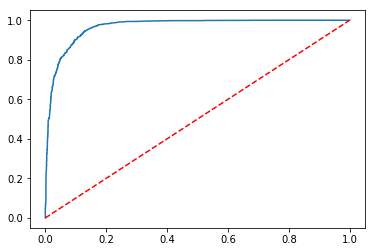

In [82]:
fpr,tpr,th = roc_curve(ytest,rfe_reg.predict(xtest[rfe_feat.Feature]))
print('ROC AUC Score:',round(roc_auc_score(ytest,rfe_ypred_test),3))
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [83]:
log_rfe = LogisticRegression().fit(xtrain_bal[rfe_feat.Feature],ytrain_bal)

In [84]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain[rfe_feat.Feature]),
    feature_names=rfe_feat.Feature,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest[rfe_feat.Feature].iloc[1],
    predict_fn=log_rfe.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [85]:
cp = classification_report(ytest,rfe_ypred_test).split()
metrics_df1 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,rfe_ypred_test),3),round(roc_auc_score(ytest,rfe_ypred_test),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Rfe_Features_model']).T

metrics_df2 = pd.concat([metrics_df,metrics_df1],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902,0.903
Rfe_Features_model,0.70,0.90,0.79,0.9,0.901


<a id="dtree"> </a>
## Decision Tree

In [86]:
dt = DecisionTreeClassifier()

###### Hyperparameter Tuning

In [87]:
params = {'max_depth':[3,4,5],
    'min_samples_split':[2,3,4],
    'min_samples_leaf':[1,2,3],
    'max_leaf_nodes':[13,14,15]}

dt_grid = GridSearchCV(dt,param_grid=params,scoring='accuracy',n_jobs=-1)
dt_grid.fit(xtrain_bal,ytrain_bal)

GridSearchCV(estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5], 'max_leaf_nodes': [13, 14, 15],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 4]},
             scoring='accuracy')

In [88]:
dt_grid.best_params_

{'max_depth': 5,
 'max_leaf_nodes': 15,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [89]:
tuned_mod = DecisionTreeClassifier(criterion= 'gini', max_depth =  4, max_leaf_nodes =  14, 
                                   min_samples_leaf =  1, min_samples_split =  2)

In [90]:
tuned_mod.fit(xtrain_bal,ytrain_bal)

DecisionTreeClassifier(max_depth=4, max_leaf_nodes=14)

In [91]:
ypred_tuned = tuned_mod.predict(xtest)

In [92]:
feat_imp = pd.DataFrame({'Features':xtest.columns,'Importance':tuned_mod.feature_importances_}).sort_values('Importance',ascending=False)
feat_imp[feat_imp.Importance!=0]

,Features,Importance
0,esent,0.957836
1,eopenrate,0.011646
4,paperless,0.011624
7,create_first,0.010042
2,eclickrate,0.007900
5,refill,0.000952


In [93]:
print('Decision Tree:')
print(classification_report(ytest,ypred_tuned))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred_tuned),3))
print('ROC AUC Score:',round(roc_auc_score(ytest,tuned_mod.predict_proba(xtest)[:,1]),2))

Decision Tree:
              precision    recall  f1-score   support

           0       0.68      0.91      0.78      1906
           1       0.97      0.89      0.93      7335

    accuracy                           0.89      9241
   macro avg       0.83      0.90      0.86      9241
weighted avg       0.91      0.89      0.90      9241

Cohen Kappa Score: 0.713
ROC AUC Score: 0.96


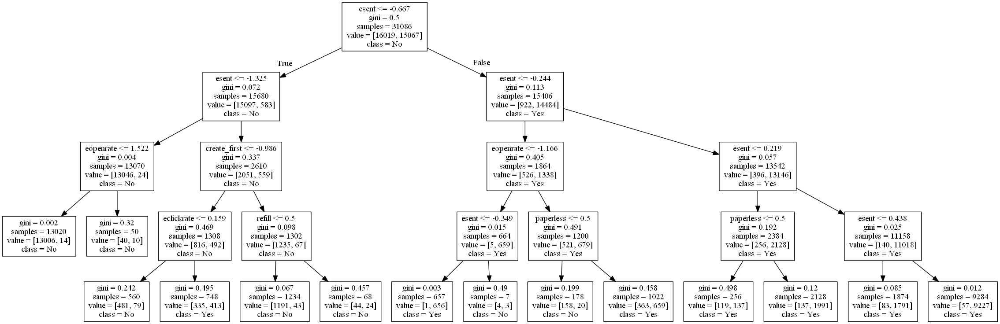

In [94]:
dot = export_graphviz(tuned_mod,feature_names=xtrain_bal.columns,class_names=['No','Yes'])
graph = pydotplus.graph_from_dot_data(dot)
Image(graph.create_png())

In [95]:
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred_tuned),2))

Cohen Kappa Score: 0.71


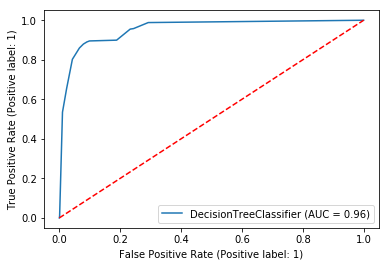

In [96]:
plot_roc_curve(estimator=tuned_mod,X= xtest,y= ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [97]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=tuned_mod.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [98]:
cp = classification_report(ytest,ypred_tuned).split()
metrics_df3 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred_tuned),3),round(roc_auc_score(ytest,ypred_tuned),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Decision_Tree']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df3],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902,0.903
Rfe_Features_model,0.70,0.90,0.79,0.9,0.901
Decision_Tree,0.68,0.91,0.78,0.894,0.9


### Random Forest (Bagging)

In [99]:
rf = RandomForestClassifier(n_estimators=250)

In [100]:
params = {'max_depth':np.arange(30,50,5)}

In [101]:
rf_grid = GridSearchCV(estimator=rf,param_grid=params,cv=5,n_jobs=-1)
rf_grid.fit(xtrain_bal,ytrain_bal)

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_estimators=250),
             n_jobs=-1, param_grid={'max_depth': array([30, 35, 40, 45])})

In [102]:
rf_grid.best_params_

{'max_depth': 45}

In [103]:
rf_tuned = RandomForestClassifier(n_estimators=250,max_depth=30).fit(xtrain_bal,ytrain_bal)

In [104]:
print('Random Forest:')
rf_ypred = rf_tuned.predict(xtest)
print(classification_report(ytest,rf_ypred))
print("Cohen Kappa Score:",round(cohen_kappa_score(rf_ypred,ytest),3))

Random Forest:
              precision    recall  f1-score   support

           0       0.72      0.92      0.81      1906
           1       0.98      0.91      0.94      7335

    accuracy                           0.91      9241
   macro avg       0.85      0.91      0.87      9241
weighted avg       0.92      0.91      0.91      9241

Cohen Kappa Score: 0.75


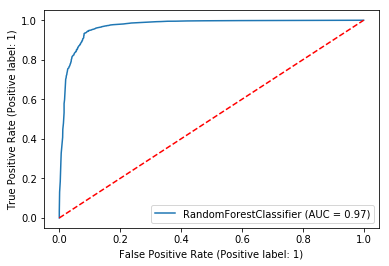

In [105]:
plot_roc_curve(estimator=rf_tuned, X = xtest, y = ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [106]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=rf_tuned.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [107]:
cp = classification_report(ytest,rf_ypred).split()
metrics_df4 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,rf_ypred),3),round(roc_auc_score(ytest,rf_ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Random_Forest']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df4],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902,0.903
Rfe_Features_model,0.70,0.90,0.79,0.9,0.901
Decision_Tree,0.68,0.91,0.78,0.894,0.9
Random_Forest,0.72,0.92,0.81,0.91,0.914


## Boosting 

### 1.Adaboost

In [108]:
adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=50)

In [109]:
adaboost.fit(xtrain_bal,ytrain_bal)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier())

In [110]:
ypred_prob = adaboost.predict_proba(xtest)[:,1]

In [111]:
ypred = adaboost.predict(xtest)


In [112]:
print('Adaboost:')
print(classification_report(ytest,ypred))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred),2))

Adaboost:
              precision    recall  f1-score   support

           0       0.44      0.93      0.59      1906
           1       0.97      0.69      0.81      7335

    accuracy                           0.74      9241
   macro avg       0.71      0.81      0.70      9241
weighted avg       0.86      0.74      0.76      9241

Cohen Kappa Score: 0.44


In [113]:
fpr,tpr,th = roc_curve(ytest,ypred_prob)

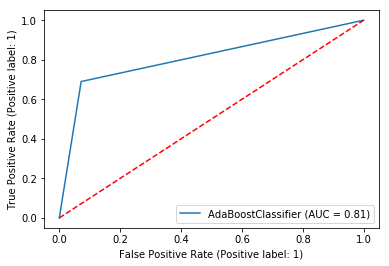

In [114]:
plot_roc_curve(estimator=adaboost,X=xtest,y=ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [115]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=adaboost.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [116]:
cp = classification_report(ytest,ypred).split()
metrics_df5 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['AdaBoost']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df5],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902,0.903
Rfe_Features_model,0.70,0.90,0.79,0.9,0.901
Decision_Tree,0.68,0.91,0.78,0.894,0.9
Random_Forest,0.72,0.92,0.81,0.91,0.914
AdaBoost,0.44,0.93,0.59,0.739,0.809


## XG Boost

In [117]:
xgb = XGBClassifier(gamma=1)

In [118]:
xgb.fit(xtrain_bal,ytrain_bal)

[22:39:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=1, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [119]:
ypred =xgb.predict(xtest)
ypred_prob = xgb.predict_proba(xtest)[:,1]

In [120]:
print('XG Boost')
print(classification_report(ytest,ypred))
print('COhen Kappa Score:',round(cohen_kappa_score(ytest,ypred),2))

XG Boost
              precision    recall  f1-score   support

           0       0.62      0.95      0.75      1906
           1       0.99      0.85      0.91      7335

    accuracy                           0.87      9241
   macro avg       0.80      0.90      0.83      9241
weighted avg       0.91      0.87      0.88      9241

COhen Kappa Score: 0.67


In [121]:
fpr,tpr,th = roc_curve(ytest,ypred_prob)

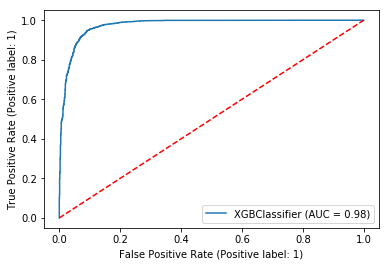

In [122]:
plot_roc_curve(estimator=xgb,X=xtest,y=ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [123]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=xgb.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [124]:
cp = classification_report(ytest,ypred).split()
metrics_df6 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['XGBoost']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df6],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902,0.903
Rfe_Features_model,0.70,0.90,0.79,0.9,0.901
Decision_Tree,0.68,0.91,0.78,0.894,0.9
Random_Forest,0.72,0.92,0.81,0.91,0.914
AdaBoost,0.44,0.93,0.59,0.739,0.809
XGBoost,0.62,0.95,0.75,0.872,0.901


## Stacking

In [125]:
base = [('dt',DecisionTreeClassifier()),('rf',RandomForestClassifier())]
stack_mod = StackingClassifier(estimators=base,final_estimator=AdaBoostClassifier())
stack_mod.fit(xtrain_bal,ytrain_bal)

StackingClassifier(estimators=[('dt', DecisionTreeClassifier()),
                               ('rf', RandomForestClassifier())],
                   final_estimator=AdaBoostClassifier())

In [126]:
ypred = stack_mod.predict(xtest)

In [127]:
print('Stacking:')
print(classification_report(ytest,ypred))
print('Cohen Kappa Score',round(cohen_kappa_score(ytest,ypred),2))

Stacking:
              precision    recall  f1-score   support

           0       0.71      0.93      0.80      1906
           1       0.98      0.90      0.94      7335

    accuracy                           0.91      9241
   macro avg       0.84      0.91      0.87      9241
weighted avg       0.92      0.91      0.91      9241

Cohen Kappa Score 0.74


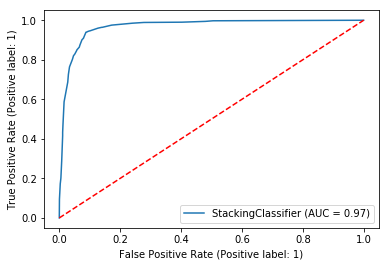

In [128]:
plot_roc_curve(estimator=stack_mod,X=xtest,y=ytest)
plt.plot([0,1],[0,1],'r--')

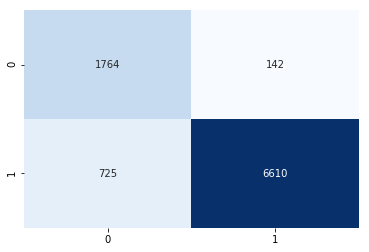

In [129]:
sns.heatmap(confusion_matrix(ytest,ypred),annot=True,fmt='d',cbar=False,cmap='Blues')

In [130]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=stack_mod.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [131]:
cp = classification_report(ytest,ypred).split()
metrics_df7 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Stacking_Reg']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df7],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902,0.903
Rfe_Features_model,0.70,0.90,0.79,0.9,0.901
Decision_Tree,0.68,0.91,0.78,0.894,0.9
Random_Forest,0.72,0.92,0.81,0.91,0.914
AdaBoost,0.44,0.93,0.59,0.739,0.809
XGBoost,0.62,0.95,0.75,0.872,0.901
Stacking_Reg,0.71,0.93,0.80,0.906,0.913


### Neural Network

In [28]:
from sklearn.neural_network import MLPClassifier
clf=MLPClassifier(solver='lbfgs',alpha=1e-5,hidden_layer_sizes=(5,2))
clf.fit(xtrain_bal,ytrain_bal)

MLPClassifier(alpha=1e-05, hidden_layer_sizes=(5, 2), solver='lbfgs')

In [134]:
print("Classification report",classification_report(ytest,ypredfull))
print("accuracy",accuracy_score(ytest,ypredfull))
print("precision",precision_score(ytest,ypredfull,average=None))
print("recall score",recall_score(ytest,ypredfull,average=None))
print("f1_score",f1_score(ytest,ypredfull,average=None))

Classification report               precision    recall  f1-score   support

           0       0.77      0.92      0.84      1906
           1       0.98      0.93      0.95      7335

    accuracy                           0.93      9241
   macro avg       0.88      0.93      0.90      9241
weighted avg       0.94      0.93      0.93      9241

accuracy 0.9280380911156801
precision [0.77202981 0.97916667]
recall score [0.92392445 0.92910702]
f1_score [0.84117507 0.95348024]


In [135]:
cp = classification_report(ytest,ypredfull).split()
metrics_df8 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypredfull),3),round(roc_auc_score(ytest,ypredfull),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Neural_networks']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df8],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902,0.903
Rfe_Features_model,0.70,0.90,0.79,0.9,0.901
Decision_Tree,0.68,0.91,0.78,0.894,0.9
Random_Forest,0.72,0.92,0.81,0.91,0.914
AdaBoost,0.44,0.93,0.59,0.739,0.809
XGBoost,0.62,0.95,0.75,0.872,0.901
Stacking_Reg,0.71,0.93,0.80,0.906,0.913
Neural_networks,0.77,0.92,0.84,0.928,0.927


In [136]:
metrics_df2.style.background_gradient(cmap='Blues')

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902000,0.903000
Rfe_Features_model,0.70,0.90,0.79,0.900000,0.901000
Decision_Tree,0.68,0.91,0.78,0.894000,0.900000
Random_Forest,0.72,0.92,0.81,0.910000,0.914000
AdaBoost,0.44,0.93,0.59,0.739000,0.809000
XGBoost,0.62,0.95,0.75,0.872000,0.901000
Stacking_Reg,0.71,0.93,0.80,0.906000,0.913000
Neural_networks,0.77,0.92,0.84,0.928000,0.927000


In [137]:
metrics_df2.style.highlight_max()

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.71,0.90,0.79,0.902000,0.903000
Rfe_Features_model,0.70,0.90,0.79,0.900000,0.901000
Decision_Tree,0.68,0.91,0.78,0.894000,0.900000
Random_Forest,0.72,0.92,0.81,0.910000,0.914000
AdaBoost,0.44,0.93,0.59,0.739000,0.809000
XGBoost,0.62,0.95,0.75,0.872000,0.901000
Stacking_Reg,0.71,0.93,0.80,0.906000,0.913000
Neural_networks,0.77,0.92,0.84,0.928000,0.927000
